# Per Pixel Calibration of Camera: ThorLabs DCC1240M
Two weeks ago, I used  the Clarkvision approach where analysis is performed on a region of 200 x 200 pixels. Metrics like average DN, SNR etc. were determined for the region as a whole. This analysis assumes that each pixel is identical and independently distributed, meaning each pixel has the same photon arrival rate, black level, gain conversion, etc.   

This analysis makes none of these assumptions. Here, we perform the same calculations for each pixel. We calibrate for each pixel its own black point, conversion gain, and read noise. 
<a class="anchor" id="first-bullet"></a>
Resources used:
1. https://clarkvision.com/imagedetail/evaluation-1d2/
2. http://www.astrosurf.com/buil/20d/20dvs10d.htm

Datasheets:
1. Camera (p. 433): https://www.thorlabs.com/drawings/2e5fa0064d7599e9-9486986F-FA66-BEF8-0208C08DE5793831/DCC1240M-Manual.pdf
2. Camera sensor: https://4donline.ihs.com/images/VipMasterIC/IC/ETOV/ETOVS01003/ETOVS01003-1.pdf?hkey=52A5661711E402568146F3353EA87419


## Table of Contents:
* [Loading in Data](#load-data)
* [Determining black point empirically](#bp-emp)
* [Determine black point, gain conversion, and read noise for each pixel](#deter)
  * [Initial look at the data](#init-look)
  * [Visualizing per pixel black point, conversion gain, and read noise as images](#vis)
  * [Comparing black point from fit results with black point determined empirically](#comp)
* [Plots for an example pixel](#plots)
  * [System Response](#sys)
  * [Average DN vs Variance](#avg)
  * [System Signal to Noise](#snr)
* [Conclusions](#conc)




## Loading in Data <a class="anchor" id="load-data"></a>

Just a bunch of code. 

In [ ]:
%matplotlib inline

import glob
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
from scipy.io import loadmat
from google.colab import drive
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from matplotlib.pyplot import imshow


sns.set(font_scale=1)
sns.set_style("whitegrid", {"axes.grid":False})
plt.rcParams['figure.figsize'] = [10, 3]
plt.rcParams['figure.dpi'] = 200

In [ ]:
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
BP_DIR = "/content/drive/My Drive/MS in CS/per pixel/bp/"
bp_filenames = glob.glob(BP_DIR + '/*.mat')

EXP_DIR = "/content/drive/My Drive/MS in CS/per pixel/exps/"
exp_filenames = glob.glob(EXP_DIR + '/*.mat')

exposures = np.array([(1+10*i)/100 for i in range(0, 61)])

In [ ]:
"""Some helper functions"""
def calc_stats(DIR, exp, num=100):
  """Calculates the min, max, std, avg per pixel per exposure, default 200 imgs"""
  min_m = np.zeros((1280, 1024)).astype(np.uint8)
  max_m = np.zeros((1280, 1024)).astype(np.uint8)
  std_m = np.zeros((1280, 1024)).astype(np.float16)
  avg_m = np.zeros((1280, 1024)).astype(np.float16)
  snr_m = np.zeros((1280, 1024)).astype(np.float16)
  all_m = []

  for i in range(1, num+1):
    mat_bp = loadmat(DIR+str(exp)+'ms_%d.mat' % i)['color']
    all_m.append(mat_bp)
  all_m = np.array(all_m).astype(np.uint8)

  for x in range(1280):
    for y in range(1024):
      min_m[x,y] = np.min(all_m[:,x,y])
      max_m[x,y] = np.max(all_m[:,x,y])
      std_m[x,y] = np.std(all_m[:,x,y])
      avg_m[x,y] = np.average(all_m[:,x,y])
      snr_m[x,y] = avg_m[x,y]/std_m[x,y] if avg_m[x,y] < 245.5 and std_m[x,y] > 0 else 0

  np.save(DIR+'processed/'+str(exp)+'ms_min.npy', min_m, allow_pickle=False)
  np.save(DIR+'processed/'+str(exp)+'ms_max.npy', max_m, allow_pickle=False)
  np.save(DIR+'processed/'+str(exp)+'ms_std.npy', std_m, allow_pickle=False)
  np.save(DIR+'processed/'+str(exp)+'ms_avg.npy', avg_m, allow_pickle=False)
  np.save(DIR+'processed/'+str(exp)+'ms_all.npy', all_m, allow_pickle=False)
  np.save(DIR+'processed/'+str(exp)+'ms_snr.npy', snr_m, allow_pickle=False)

  return min_m, max_m, std_m, avg_m, snr_m

In [ ]:
%%time
# Loading in stats for each eposure
avg_m, max_m, std_m, snr_m = [], [], [], []

for i, exp in enumerate(exposures):
  avg_i = np.load(EXP_DIR+'processed/'+str(exp)+'ms_avg.npy')
  max_i = np.load(EXP_DIR+'processed/'+str(exp)+'ms_max.npy')
  std_i = np.load(EXP_DIR+'processed/'+str(exp)+'ms_std.npy')
  snr_i = np.load(EXP_DIR+'processed/'+str(exp)+'ms_snr.npy')

  avg_m.append(avg_i)
  max_m.append(max_i)
  std_m.append(std_i)
  snr_m.append(snr_i)

avg_m = np.array(avg_m).astype(np.float32)
max_m = np.array(max_m).astype(np.uint8)
std_m = np.array(std_m).astype(np.float32)
snr_m = np.array(snr_m).astype(np.float32)


CPU times: user 1.45 s, sys: 1.06 s, total: 2.51 s
Wall time: 3.47 s


In [ ]:
%%time
# Apply linear fits to each exposure capture
gain_conv_m = np.zeros(avg_m[0,:,:].shape)  # In units e- / 8bit DN
read_ns_m   = np.zeros(avg_m[0,:,:].shape)  # In units 8 bit DN
black_pt_m  = np.zeros(avg_m[0,:,:].shape)  # In units 8 bit DN

neg_read_ns = []

for x in range(avg_m[0,:,:].shape[0]):
  for y in range(avg_m[0,:,:].shape[1]):

    # Find constants
    SAT = np.where(max_m[:,x,y]==255)[0][0]-2

    # Find black point
    gain_dn, black_pt_m[x,y] = np.polyfit(exposures[:SAT], avg_m[:SAT,x,y], 1) # DN

    # Find gain conversion and read noise
    m, b = np.polyfit(avg_m[:SAT,x,y], std_m[:SAT,x,y]**2, 1)
    gain_conv_m[x,y] = 1/m  # e-/DN
    read_ns_m[x,y] = b
     
    if b < 0:
      neg_read_ns.append((x,y))

CPU times: user 4min 12s, sys: 2.02 s, total: 4min 14s
Wall time: 4min 11s


## Determining black point empirically <a class="anchor" id="bp-emp"></a>
The purpose of this investigation is to have an independent method of evaluation the black point of each pixel. 


Haitang has provided me with 200 images taken with the camera blocked (no light hitting sensor). Instructions I gave him: 

1. Gain = 1x
2. Leave the cap on the camera so that the sensor is optically shielded (no light gets detected by the sensor)
3. Use the minimum possible exposure time: 0.009 ms


After an initial glance at a few random images, it seems like the images themselves are pretty identical and similar to the black point images taken from the previous acquisition. However we still see the same issue of non-uniform brightening -- the image is brighter on the right than left. 



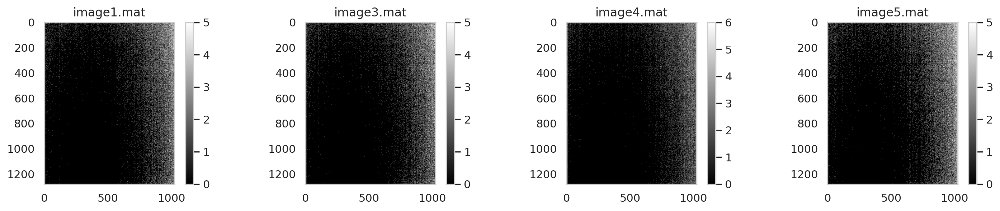

In [ ]:
# An initial look at a few images
mat_bp0 = loadmat(BP_DIR+'0.009ms_%d.mat' % 1)
mat_bp2 = loadmat(BP_DIR+'0.009ms_%d.mat' % 50)
mat_bp3 = loadmat(BP_DIR+'0.009ms_%d.mat' % 100)
mat_bp4 = loadmat(BP_DIR+'0.009ms_%d.mat' % 150)

fig, (ax0, ax2, ax3, ax4) = plt.subplots(figsize=(18, 3), ncols=4)
ax0.set_title('image1.mat')
ax2.set_title('image3.mat')
ax3.set_title('image4.mat')
ax4.set_title('image5.mat')

im0 = ax0.imshow(mat_bp0['color'], cmap='gray', interpolation='none')
fig.colorbar(im0, ax=ax0)

im2 = ax2.imshow(mat_bp2['color'], cmap='gray', interpolation='none')
fig.colorbar(im2, ax=ax2)

im3 = ax3.imshow(mat_bp3['color'], cmap='gray', interpolation='none')
fig.colorbar(im3, ax=ax3)

im4 = ax4.imshow(mat_bp4['color'], cmap='gray', interpolation='none')
fig.colorbar(im4, ax=ax4)

plt.show()

Next, I used 2D matrices to track the following across the 200 images:
1. Matrix containing the minimum value per pixel 
2. Matrix containing the maximum value per pixel
3. Matrix containing the std per pixel
4. Matrix containing the average value per pixel

Each matrix is then plotted below. 

Each image has dimensions: (1280, 1024)

It's interesting to see that the right edge of the minimum value matrix image still shows an offset. Is this worth investigating?

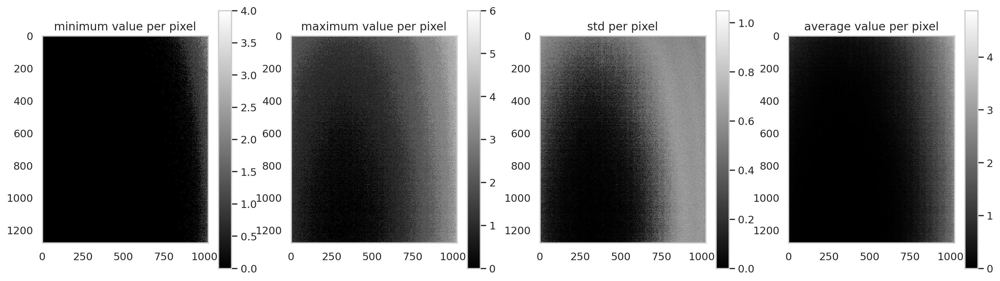

In [ ]:
# And let's plot these results
exp = '0.009'
bp_min_m = np.load(BP_DIR+'processed/'+exp+'ms_min.npy')
bp_avg_m = np.load(BP_DIR+'processed/'+exp+'ms_avg.npy').astype(np.float32)
bp_max_m = np.load(BP_DIR+'processed/'+exp+'ms_max.npy')
bp_std_m = np.load(BP_DIR+'processed/'+exp+'ms_std.npy').astype(np.float32)

fig, (ax0, ax1, ax2, ax3) = plt.subplots(figsize=(18, 5), ncols=4)
ax0.set_title('minimum value per pixel')
ax1.set_title('maximum value per pixel')
ax2.set_title('std per pixel')
ax3.set_title('average value per pixel')

im0 = ax0.imshow(bp_min_m, cmap='gray', vmin=0, vmax=np.max(bp_min_m), interpolation='none')
fig.colorbar(im0, ax=ax0)
im1 = ax1.imshow(bp_max_m, cmap='gray', vmin=0, vmax=np.max(bp_max_m), interpolation='none')
fig.colorbar(im1, ax=ax1)
im2 = ax2.imshow(bp_std_m, cmap='gray', vmin=0, vmax=np.max(bp_std_m), interpolation='none')
fig.colorbar(im2, ax=ax2)
im3 = ax3.imshow(bp_avg_m, cmap='gray', vmin=0, vmax=np.max(bp_avg_m), interpolation='none')
fig.colorbar(im3, ax=ax3)

plt.show()

## Determine black point, gain conversion and read noise for each pixel <a class="anchor" id="deter"></a>
This analysis is similar to the one found in [Clarkvision](https://https://clarkvision.com/imagedetail/evaluation-1d2/) except on a per pixel basis and using a variance vs average DN graph to determine the total number of electrons instead of SNR. 

**Parameters to determine per pixel**  



1.   Black point [DN]: Determined through plotting the camera's reponse (average 8-bit DN) as a function of exposure time, fitting to a linear polynomial to it and determining the y-intercept. 
2.   Gain conversion [e-/DN]: Determined through plotting the camera's average DN as a function of variance, fitting to a linear polynomia, and determining the slope of the fit.   
3.   Read Noise (left as variance): Determined through plotting the camera's average DN as a function of variance, fitting to a linear polynomia, and determining the y-intercept of the fit. However, there were occasions where the y-intecept was negative.  The number of pixels that have negative intercepts were found to be  < 950, which is  0.07% of all pixels in the image. 


Each of these parameters are determined through linear fits for each pixel. They are then stored in a 2D matrix, with the location of the matrix denoting the location of the respective pixel. These 2D matrices can then be visualized as images, which I do in the next section. 

However, prior to doing this, I used 2D matrices to track the following across all of the images for each exposure:
1. Matrix containing the minimum pixel value per pixel
2. Matrix containing the maximum pixel value per pixel
3. Matrix containing the std per pixel
4. Matrix containing the average pixel value per pixel

These matrices are saved to file for faster data retrieval. 

**Image capture setup**  

Haitang has provided 100 images at each exposure. The particular instructions were similar to last time. 


*   Datetime of acquisition: 09/19/2020 10:44 - 11:04 AM
*   A delay of 120 ms between each image capture
*   The wall beside a window was chosen. The wall was illuminated by the scattering of sunlight through the window.   

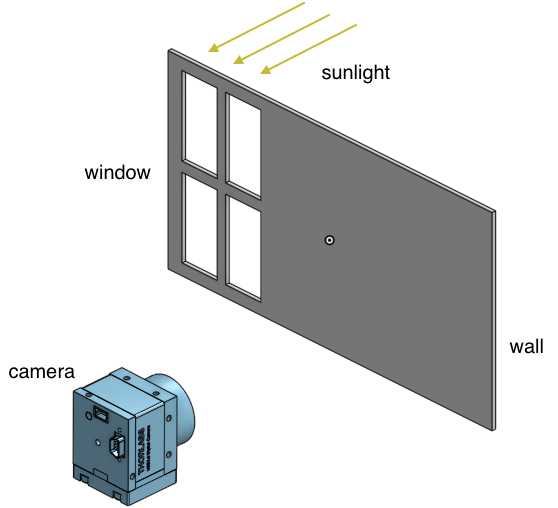


### Initial look at the data <a class="anchor" id="init-look"></a>
Let's view a few of images from each exposure time side by side. 

*Observations*:  

- Similar to the last analysis, the image brightens more on the right compared to the left. It's not as emphasized as before though.   
- Starting from 1.01 ms, there seems to be a dark streak on the right edge. This is more apparent in the images at 5.01 ms. This streak was seen/as obvious in the last round of captures.   

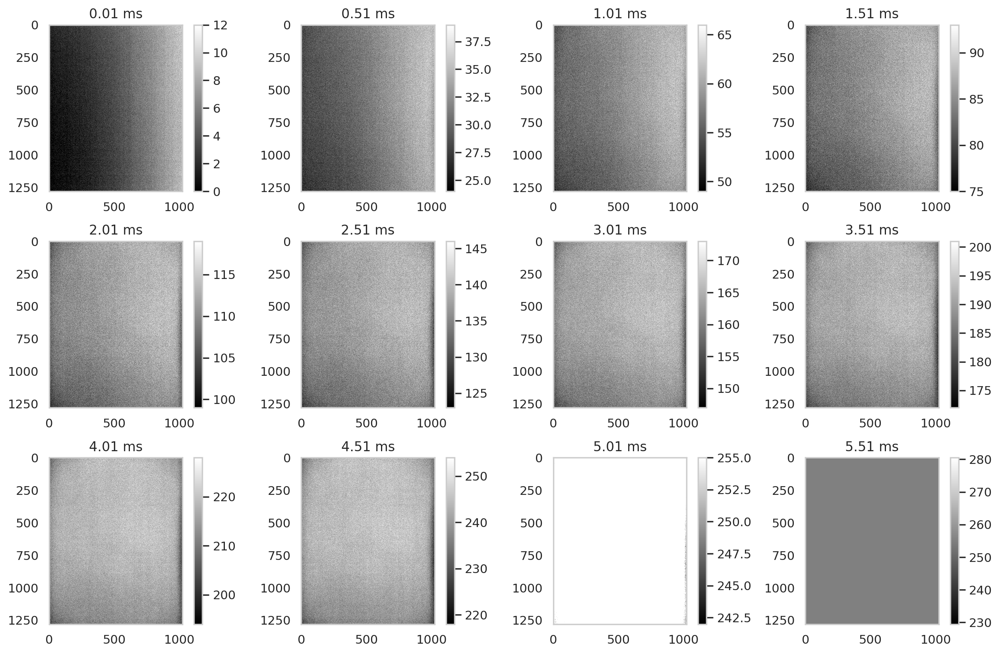

In [ ]:
fig = plt.figure(figsize=(16, 10))
grid = plt.GridSpec(3, 4, wspace=0.1, hspace=0.3)

for i, exp in enumerate([0.01+0.5*i for i in range(12)]):
  mat = loadmat(EXP_DIR+str(exp)+'ms_1.mat')['color']
  ax = fig.add_subplot(grid[i//4, i%4], title=str(exp)+" ms")
  im = ax.imshow(mat, cmap='gray', vmin=np.min(mat), vmax=np.max(mat), interpolation='none')
  fig.colorbar(im, ax=ax)

### Visualizing per pixel black point, conversion gain, and read noise as images <a class="anchor" id="vis"></a>

Since our fit parameters are stored in 2D matrices with the locations of each value denoting the respective pixel location, we can visualize each matrix as an image. In this section, we present two visualizations:



*   Images of each fit parameter
*   Histograms showing the normalized frequency distributions for each distribution. I was interested in seeing how the fits varied across the pixels.



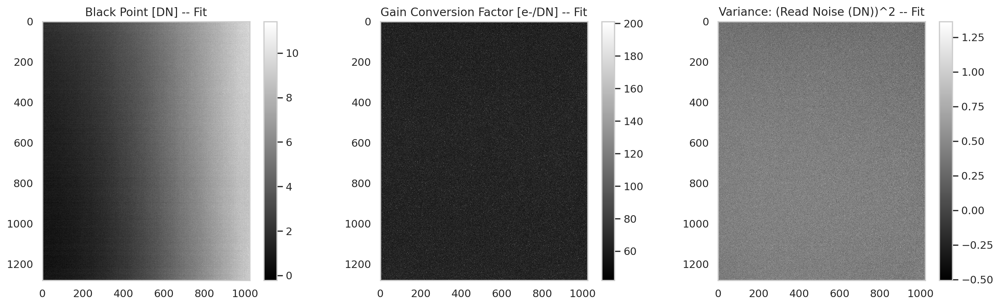

In [ ]:
# A simple plot viewing per pixel values as images
fig, (ax0, ax1, ax2) = plt.subplots(figsize=(18, 5), ncols=3)
ax0.set_title('Black Point [DN] -- Fit')
ax1.set_title('Gain Conversion Factor [e-/DN] -- Fit')
ax2.set_title(r'Variance: (Read Noise (DN))^2 -- Fit')

im0 = ax0.imshow(black_pt_m, cmap='gray', vmin=np.min(black_pt_m), vmax=np.max(black_pt_m), interpolation='none')
fig.colorbar(im0, ax=ax0)
im1 = ax1.imshow(gain_conv_m, cmap='gray', vmin=np.min(gain_conv_m), vmax=np.max(gain_conv_m), interpolation='none')
fig.colorbar(im1, ax=ax1)
im2 = ax2.imshow(read_ns_m, cmap='gray', vmin=np.min(read_ns_m), vmax=np.max(read_ns_m), interpolation='none')
fig.colorbar(im2, ax=ax2)

plt.show()

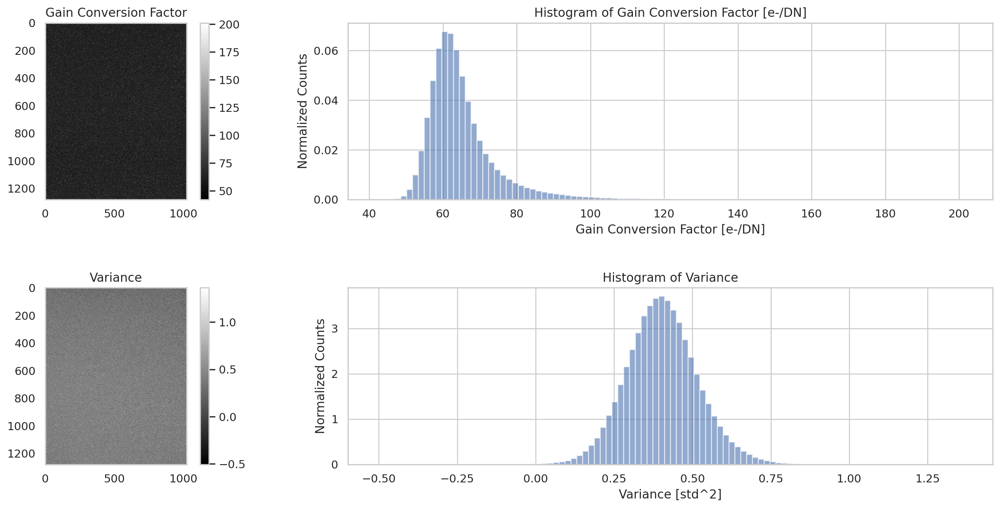

In [ ]:
fig = plt.figure(figsize=(18, 8))
grid = plt.GridSpec(2, 3, wspace=0.4, hspace=0.5)
ax1 = fig.add_subplot(grid[0, 0], title="Gain Conversion Factor")
ax2 = fig.add_subplot(grid[0, 1:],title="Histogram of Gain Conversion Factor [e-/DN]", xlabel="Gain Conversion Factor [e-/DN]", ylabel="Normalized Counts")
ax3 = fig.add_subplot(grid[1, 0], title="Variance")
ax4 = fig.add_subplot(grid[1, 1:], title="Histogram of Variance", xlabel="Variance [std^2]", ylabel="Normalized Counts")

im1 = ax1.imshow(gain_conv_m, cmap='gray', vmin=np.min(gain_conv_m), vmax=np.max(gain_conv_m), interpolation='none')
fig.colorbar(im1, ax=ax1)
n, bins, patches = ax2.hist(gain_conv_m.flatten(), 100, density=True, alpha=0.6)
ax2.grid('on')

im3 = ax3.imshow(read_ns_m, cmap='gray', vmin=np.min(read_ns_m), vmax=np.max(read_ns_m), interpolation='none')
fig.colorbar(im3, ax=ax3)
n, bins, patches = ax4.hist(read_ns_m.flatten(), 100, density=True, alpha=0.6)
ax4.grid('on')

### Comparing black point from fit results with black point determinined empirically <a class="anchor" id="comp"></a>

This is an extension of our visualizations. In this section, I was interested in comparing the black point values we derived from our fits with the ones obtained empirically in the "Determing black point independently". 

Below, I show two graphs:
- 1st row of graphs: average DN values from the empirical method  
- 2nd row of graphs: DN values derived from our linear polynomial fits. 

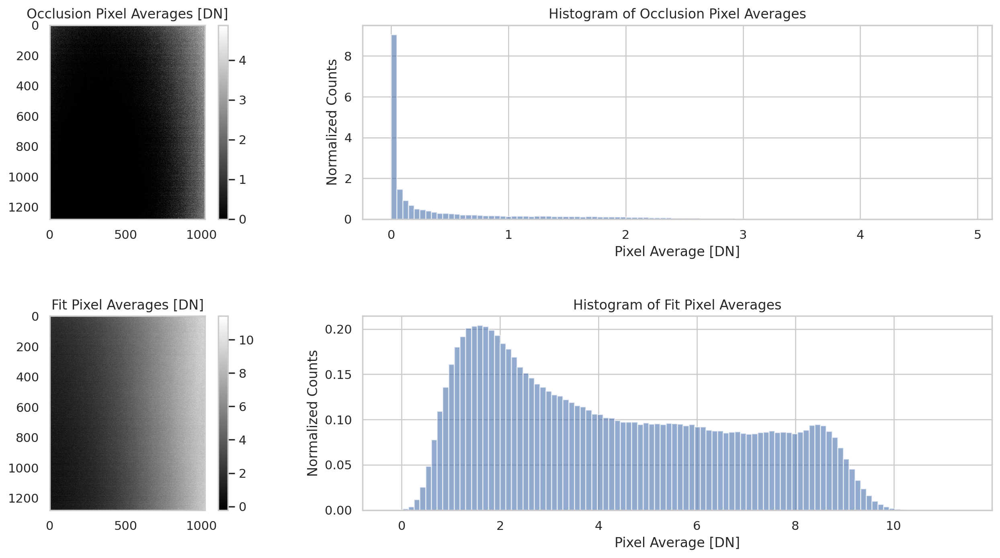

In [ ]:
fig = plt.figure(figsize=(16, 8))
grid = plt.GridSpec(2, 3, wspace=0.4, hspace=0.5)
ax1 = fig.add_subplot(grid[0, 0], title="Occlusion Pixel Averages [DN]")
ax2 = fig.add_subplot(grid[0, 1:],title="Histogram of Occlusion Pixel Averages", xlabel="Pixel Average [DN]", ylabel="Normalized Counts")
ax3 = fig.add_subplot(grid[1, 0], title="Fit Pixel Averages [DN]")
ax4 = fig.add_subplot(grid[1, 1:], title="Histogram of Fit Pixel Averages", xlabel="Pixel Average [DN]", ylabel="Normalized Counts")

im1 = ax1.imshow(bp_avg_m, cmap='gray', vmin=np.min(bp_avg_m), vmax=np.max(bp_avg_m), interpolation='none')
fig.colorbar(im1, ax=ax1)
n, bins, patches = ax2.hist(bp_avg_m.flatten(), 100, density=True, alpha=0.6)
ax2.grid('on')
im3 = ax3.imshow(black_pt_m, cmap='gray', vmin=np.min(black_pt_m), vmax=np.max(black_pt_m), interpolation='none')
fig.colorbar(im3, ax=ax3)
n, bins, patches = ax4.hist(black_pt_m.flatten(), 100, density=True, alpha=0.6)
ax4.grid('on')

## Plots for an example pixel <a class="anchor" id="plots"></a>

Below, I show what the analysis looks like for an example pixel. The graphs show here are for pixel (1000x800). The pixel was chosen randomly. 

In [ ]:
# 1: Particular pixel to view
x,y = 1000, 800

# 2: index before the first index of exposure where the max_dn  
#    in the pixel is saturated
SAT = np.where(max_m[:,x,y]==255)[0][0]-2
print("Saturation index for pixel %d x %d: %d" %(x, y, SAT))

Saturation index for pixel 1000 x 800: 45


### System Response <a class="anchor" id="sys"></a>

The camera shows a linear trend even near saturation, showing that it has a linear response (as advertised).

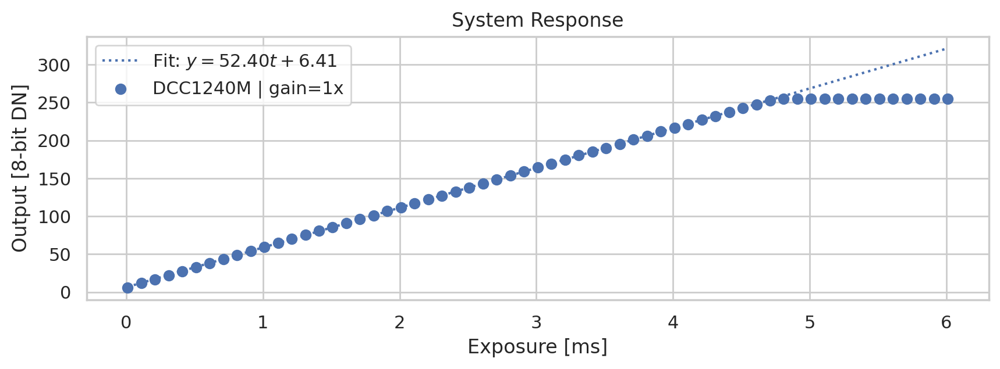

In [ ]:
m, black_pt = np.polyfit(exposures[:SAT], avg_m[:SAT,x,y], 1) # DN

plt.plot(
  exposures, 
  m*exposures+black_pt, 
  linestyle=":", 
  label=r"Fit: $y = {0:.2f}t+{1:.2f}$".format(m,black_pt)
)
plt.scatter(
    exposures, 
    avg_m[:,x,y], 
    label="DCC1240M | gain=1x")
plt.xlabel("Exposure [ms]")
plt.ylabel("Output [8-bit DN]")
plt.title("System Response")
plt.legend()
plt.grid()

### Average DN vs Variance <a class="anchor" id="avg"></a>

From each pixel, an average pixel value and variance for each exposure time was calculated using the 100 images. The variance is then plotted against the average DN and fitted to a linear polynomial. 



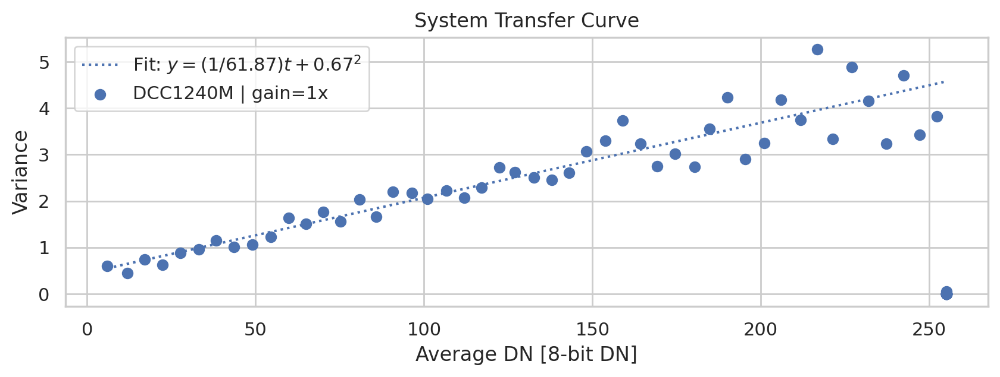

In [ ]:
m, b = np.polyfit(avg_m[:SAT,x,y], std_m[:SAT,x,y]**2, 1)
gain_conv = 1/m        # e-/DN
read_ns   = np.sqrt(b) # DN

plt.plot(
    avg_m[:,x,y], 
    m*avg_m[:,x,y]+b, 
    linestyle=":", 
    label=r"Fit: $y = (1/{0:.2f})t+{1:.2f}^2$".format(gain_conv, read_ns)
)
plt.scatter(
    avg_m[:,x,y], 
    std_m[:,x,y]**2, 
    label="DCC1240M | gain=1x"
)
plt.xlabel("Average DN [8-bit DN]")
plt.ylabel("Variance")
plt.title("System Transfer Curve")
plt.legend()
plt.grid()

### System Signal to Noise <a class="anchor" id="snr"></a>

From each pixel, an average pixel value and standard deviation for each exposure time was calculated using the 100 images. SNR was then calculated for each pixel by dividing the average DN by the std.  




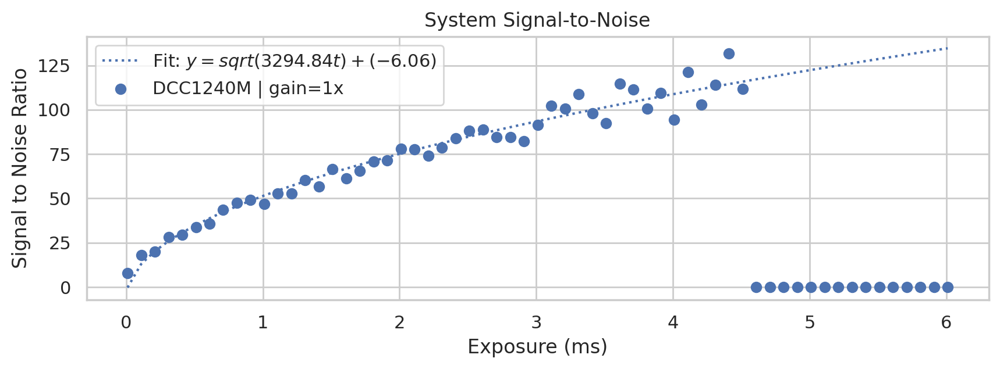

In [ ]:
def sqr(x, a, b):
  return np.sqrt(a * x) + b
popt, pcov = curve_fit(sqr, exposures[:SAT], snr_m[:SAT,x,y])

plt.plot(
    exposures, 
    sqr(exposures, popt[0], popt[1]), 
    linestyle=":", 
    label=r"Fit: $y = sqrt({0:.2f}t)+({1:.2f})$".format(popt[0], popt[1])
)
plt.scatter(
    exposures, 
    snr_m[:,x,y], 
    label="DCC1240M | gain=1x"
)
plt.xlabel("Exposure (ms)")
plt.ylabel(r"Signal to Noise Ratio")
plt.title("System Signal-to-Noise")
plt.legend()
plt.grid()

## Conclusions <a class="anchor" id="conc"></a>

- Under uniform lighting (scattering from sunlight), the camera response is linear with no discernable perturbations near saturation. 

- The conversion gains acquired from the fits are higher than what the datasheet gives us. From the histogram graph in section (), most conversion gain values are around the low 60s [e-/DN] range. 

  The datasheet for the camera CMOS sensor (EV76C560) states that the saturation charge per pixel to be 12,000 electrons per pixel. This corresponds to a conversion gain of 

  $$\frac{12000}{250 \pm 5} = 48 \pm 1 \text{ [e-/DN]}$$

- We still see non uniformities in the black points regardless of which technique we use to measure it. 